<a href="https://colab.research.google.com/github/adgodoyo/Classic_Computer_Vision/blob/grupo5_mythili_elissa/Taller2_IVC_Mythili_Kasibhatla_%26_Elissa_Castellanos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Taller 2
### Mythili Kasibhatla & Elissa Castellanos
#### Línea de Trabajo *Detección de Moho y Deterioro en Alimentos*

## Introducción
La detección automatizada de moho y deterioro en frutas mediante visión por computadora es un campo crítico para reducir el desperdicio de alimentos y garantizar estándares de calidad. En este trabajo, nos centramos en desarrollar un sistema de clasificación robusto para distinguir entre frutas frescas y podridas (manzanas, plátanos y naranjas), utilizando técnicas avanzadas de procesamiento de imágenes y aprendizaje automático.

Para ello, implementamos un pipeline modular que combina:
1.   Preprocesamiento de imágenes: Filtrado de suavizado (Gaussiano), detección de bordes (Canny, Sobel) y ecualización de histogramas para normalizar iluminación y resaltar características morfológicas.
2.   Extracción de características: Descriptores como SIFT/SURF y métodos de agregación (Bag of Visual Words) para capturar patrones de deterioro (moho, decoloración).
3.   Clasificación supervisada: Entrenamiento de modelos (SVM, Random Forest) optimizados mediante Grid Search, evaluados con métricas de precisión y recall.
4.   Enfoques no supervisados: Segmentación por color (k-means) para casos con etiquetado limitado.

El dataset utilizado es un fragmento aleatorio de [Kaggle: Fruits Fresh and Rotten](https://www.kaggle.com/datasets/sriramr/fruits-fresh-and-rotten-for-classification). Decidimos reducirlo porque el dataset original tenia aprozimadamenre 13mil imagenes, lo cual hacia muy lenta la ejecución de nuestro trabajo. Se dejo un dataset de 500 imágenes etiquetadas que permiten validar cada etapa del pipeline. Nuestro objetivo es ofrecer una solución escalable, con potencial para integrarse en sistemas de inspección industrial o aplicaciones móviles de control de calidad.


In [85]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [86]:
dataset_path = "/content/drive/MyDrive/dataset_simplified"

In [87]:
import os
print("Carpetas dentro de dataset:", os.listdir(dataset_path))

Carpetas dentro de dataset: ['test', 'val', 'train', 'mold_classifier_rf.pkl', 'processed_images']


## Filtrado y Convolución

Queremos aplicar filtros de detección de bordes para resaltar características importantes en imágenes de frutas frescas y podridas. Para esto, usamos la convolución con los filtros Prewitt en las direcciones X e Y.

¿Cómo funciona el código?
1.  Cargar la imagen: Se selecciona una imagen aleatoria de la carpeta de entrenamiento.
2.  Definir los filtros: Se crean los kernels de Prewitt y Sobel en las direcciones X e Y.
3.  Aplicar convolución: Se usa  **`cv2.filter2D()`** para aplicar los filtros a la imagen.
4.  Calcular la magnitud: Se combina la respuesta en X e Y usando **`cv2.magnitude()`**.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def aplicar_filtros_sobel_prewitt(img):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    sobel = cv2.magnitude(sobelx, sobely)

    kernelx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    kernely = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    prewittx = cv2.filter2D(img, -1, kernelx).astype(np.float32)
    prewitty = cv2.filter2D(img, -1, kernely).astype(np.float32)
    prewitt = cv2.magnitude(prewittx, prewitty)

    return sobel, prewitt

## Detección de Bordes y Umbralización

En esta sección, aplicamos técnicas para resaltar características clave en las imágenes de frutas.

¿Cómo funciona el código?
1.  Cargar la imagen: Elegimos una imagen aleatoria del dataset y la convertimos a escala de grises.
2.  Aplicar Canny: Detectamos bordes analizando gradientes de la imagen.
3.  Aplicar Otsu: Segmentamos la imagen automáticamente con un umbral óptimo.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def aplicar_canny_y_otsu(img):
    canny = cv2.Canny(img.astype(np.uint8), 100, 200)
    _, otsu = cv2.threshold(img.astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return canny, otsu

## Ecualización de Histogramas

Para mejorar la visibilidad de detalles en imágenes de frutas, aplicamos ecualización de histograma, una técnica que redistribuye los niveles de intensidad y resalta áreas de interés.

¿Cómo funciona el código?

1.  Cargar la imagen: Convertimos la imagen a escala de grises.
2.  Aplicar ecualización: Usamos **`cv2.equalizeHist()`** para mejorar el contraste.

Esto nos va a ayudar a resaltar diferencias en textura y manchas, mejora la segmentación en pasos posteriores y facilita la detección de áreas afectadas por moho.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def ecualizar_imagen(img):
    return cv2.equalizeHist(img)

In [ ]:
def procesar_y_guardar_imagenes(dataset_path, mostrar=False):
    train_path = os.path.join(dataset_path, "train")
    imagenes_procesadas = []
    etiquetas = []

    for categoria in os.listdir(train_path):
        cat_path = os.path.join(train_path, categoria)

        for img_name in os.listdir(cat_path):
            img_path = os.path.join(cat_path, img_name)

            # Cargar imagen
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                print(f"Error cargando {img_path}")
                continue

            # Sobel y Prewitt
            sobel, prewitt = aplicar_filtros_sobel_prewitt(img)

            # Canny y Otsu sobre Sobel
            canny, otsu = aplicar_canny_y_otsu(sobel)

            # Ecualización sobre Otsu
            ecualizada = ecualizar_imagen(otsu)

            imagenes_procesadas.append(ecualizada)
            etiquetas.append(categoria)

            # Mostrar visualización si se activa la opción
            if mostrar:
                plt.figure(figsize=(18, 4))
                plt.subplot(1, 6, 1)
                plt.imshow(img, cmap='gray')
                plt.title("Original")
                plt.axis("off")

                plt.subplot(1, 6, 2)
                plt.imshow(prewitt, cmap='gray')
                plt.title("Prewitt")
                plt.axis("off")

                plt.subplot(1, 6, 3)
                plt.imshow(sobel, cmap='gray')
                plt.title("Sobel")
                plt.axis("off")

                plt.subplot(1, 6, 4)
                plt.imshow(canny, cmap='gray')
                plt.title("Canny")
                plt.axis("off")

                plt.subplot(1, 6, 5)
                plt.imshow(otsu, cmap='gray')
                plt.title("Otsu")
                plt.axis("off")

                plt.subplot(1, 6, 6)
                plt.imshow(ecualizada, cmap='gray')
                plt.title("Ecualizada")
                plt.axis("off")

                plt.suptitle(f"{categoria}/{img_name}")
                plt.tight_layout()
                plt.show()

    return imagenes_procesadas, etiquetas

processed_images, labels = procesar_y_guardar_imagenes(dataset_path, mostrar=True)

## Feature Detection y Descriptores (SIFT)

Las características detectadas por SIFT son invariantes a escala, rotación e iluminación, lo que significa que el algoritmo puede encontrar los mismos puntos clave incluso si la imagen se redimensiona, rota o cambia de iluminación.

SIFT funciona en dos pasos principales:
1. Detección de puntos clave: Encuentra puntos interesantes en la imagen (bordes, esquinas, etc.).
2. Extracción de descriptores: Genera un vector de características que describe cada punto clave para poder compararlos entre imágenes.

### SIFT

In [ ]:
import cv2
import matplotlib.pyplot as plt
import random
import os

def extract_sift_features_from_images(image_list):
    sift = cv2.SIFT_create()
    descriptors_list = []

    for img in image_list:
        keypoints, descriptors = sift.detectAndCompute(img, None)
        if descriptors is not None:
            descriptors_list.append(descriptors)
    return descriptors_list

descriptor_list = extract_sift_features_from_images(processed_images)

Este código define una función extract_sift_features que extrae características SIFT (Scale-Invariant Feature Transform) de una lista de imágenes. Usando OpenCV, lee cada imagen en escala de grises, detecta keypoints y calcula sus descriptores SIFT, almacenándolos en una lista. Si una imagen no se puede leer o no genera descriptores, se omite. La función devuelve una lista de descriptores para las imágenes procesadas correctamente. Al final, se llama a la función con [processed_images], que son las imagenes con filtros, detección de bordes, umbralización y ecualización

Se extraen los descriptores SIFT de todas las imágenes del dataset. Cada descriptor captura información local de la imagen (bordes, esquinas, texturas) en regiones clave. Estos descriptores son fundamentales para construir el vocabulario visual en el modelo BoVW.


##  Bag of Visual Words (BoVW)

En el campo de la Visión Computacional, el enfoque de Bag of Visual Words (BoVW) es una técnica clásica y poderosa para representar imágenes a partir de sus características locales. Inspirado en el modelo de "Bag of Words" usado en procesamiento de texto, BoVW permite describir visualmente una imagen como una colección de “palabras visuales” obtenidas a partir de descriptores locales como SIFT, SURF o ORB, en este caso implementamos BoVW con SIFT.

Funciona de la siguiente manera.
1. Extracción de características locales: Cada imagen se analiza para identificar puntos clave mediante un detector como SIFT (Scale-Invariant Feature Transform). En esos puntos se calculan descriptores que codifican la textura o patrón local.

2. Construcción del vocabulario visual: Se agrupan todos los descriptores extraídos del conjunto de imágenes mediante un algoritmo de clustering como KMeans. Cada clúster representa una “palabra visual”.

3. Vectorización de imágenes: Cada imagen es convertida en un vector (histograma) que representa la frecuencia de aparición de cada palabra visual en la imagen. Así, imágenes con patrones similares tendrán vectores similares.

4. Clasificación: Estos vectores se pueden usar como entrada para algoritmos de Machine Learning como SVM o Random Forest para realizar tareas de clasificación, como detección de moho, deterioro o cualquier otra anomalía visual.

En este proyecto, BoVW se usa para representar imágenes de alimentos en diferentes estados (frescos, con moho, deteriorados, etc.). Esta representación permite entrenar modelos capaces de reconocer el deterioro visual de manera automática, replicando cómo un experto humano analizaría texturas o manchas para identificar un alimento contaminado.

#### 3. Crear el vocabulario visual con KMeans

In [ ]:
from sklearn.cluster import MiniBatchKMeans

def build_vocabulary(descriptor_list, vocab_size=100):
    all_descriptors = np.vstack(descriptor_list)
    kmeans = MiniBatchKMeans(n_clusters=vocab_size, random_state=42)
    kmeans.fit(all_descriptors)
    return kmeans

kmeans = build_vocabulary(descriptor_list, vocab_size=100)

Se construye el vocabulario visual utilizando KMeans. Todos los descriptores SIFT de todas las imágenes se agrupan en un solo arreglo (all_descriptors). Luego, se aplica MiniBatchKMeans para agruparlos en 'vocab_size' clústeres, donde cada clúster representa una "palabra visual". Este vocabulario será usado para convertir cada imagen en un histograma de palabras visuales.


#### 4. Construir histogramas de “palabras visuales” para cada imagen

In [ ]:
def create_bovw_histograms(kmeans, descriptor_list, vocab_size):
    histograms = []
    for descriptors in descriptor_list:
        if descriptors is not None:
            predictions = kmeans.predict(descriptors)
            hist, _ = np.histogram(predictions, bins=np.arange(vocab_size + 1))
        else:
            hist = np.zeros(vocab_size)
        histograms.append(hist)
    return np.array(histograms)

histograms = create_bovw_histograms(kmeans, descriptor_list, vocab_size=100)

Esta función transforma cada imagen en un histograma de "palabras visuales". Usando el modelo KMeans previamente entrenado, se predice a qué clúster (palabra visual) pertenece cada descriptor SIFT. Luego, se cuenta cuántos descriptores cayeron en cada clúster para formar un histograma. El resultado es un vector de longitud igual al tamaño del vocabulario, que representa la imagen y sirve como entrada para modelos de clasificación.


#### 5. Visualizar el vocabulario como histogramas

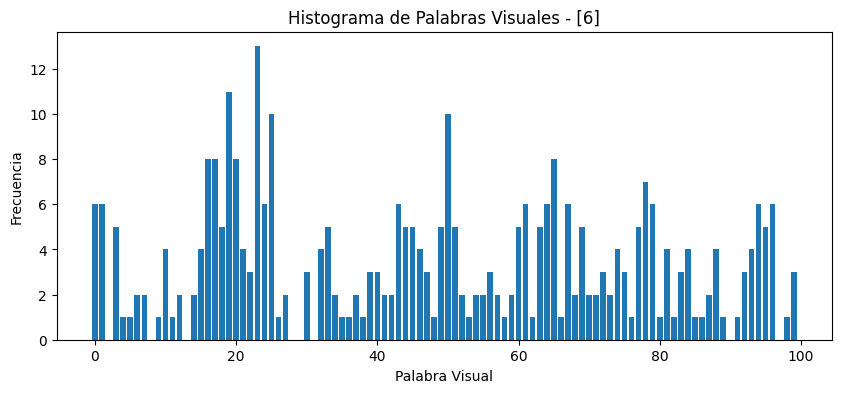

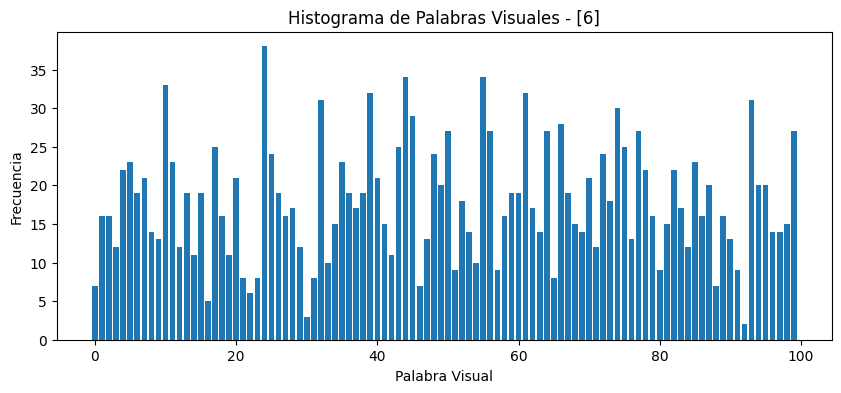

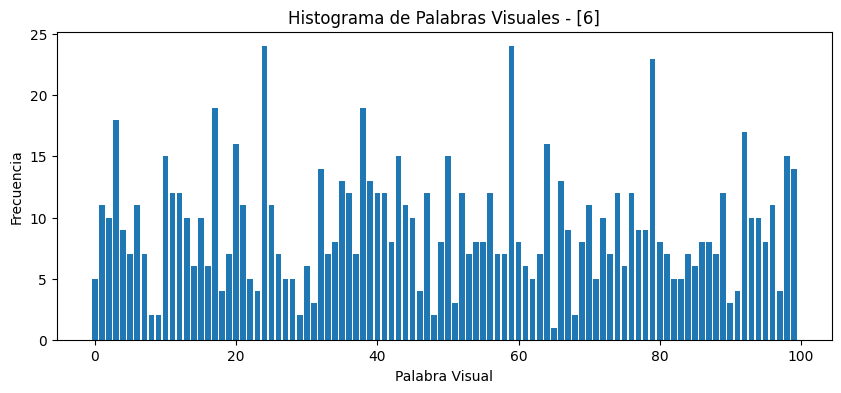

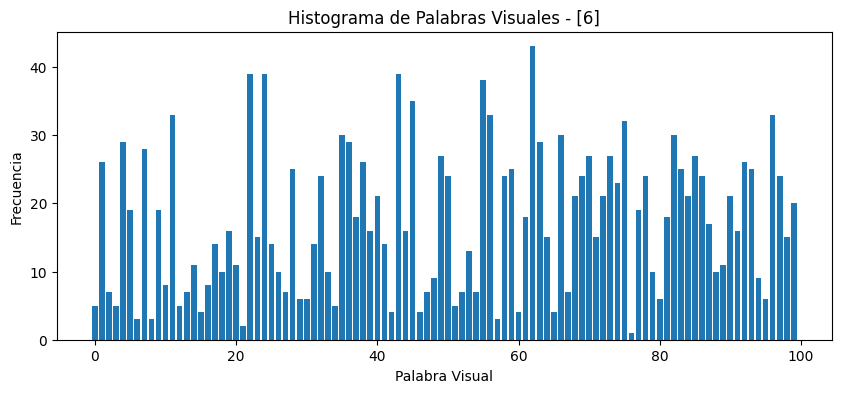

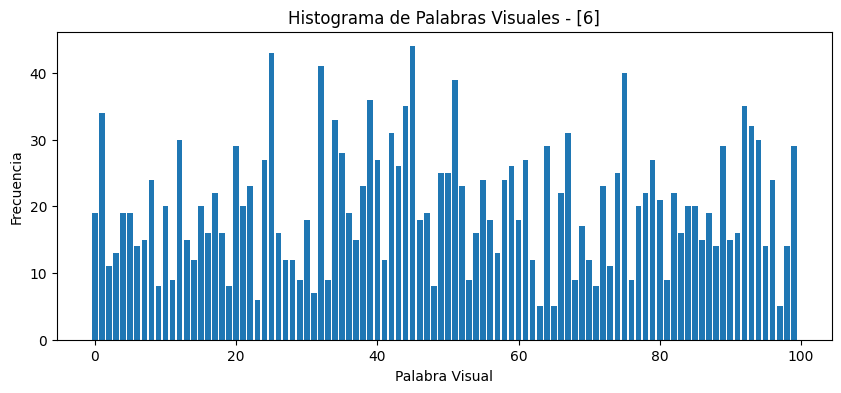

...

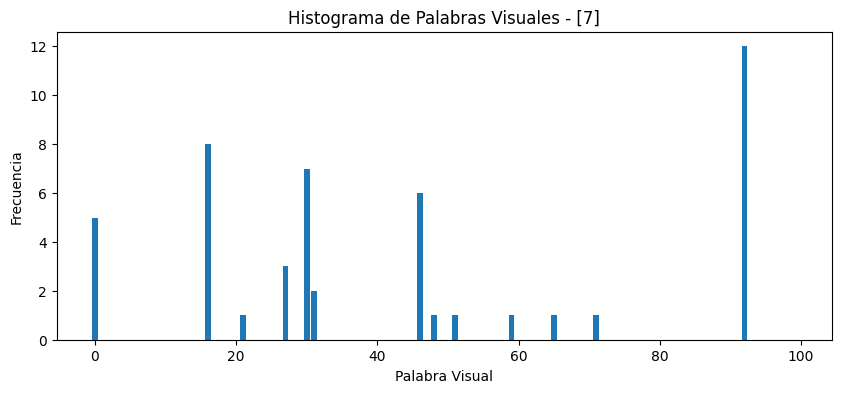

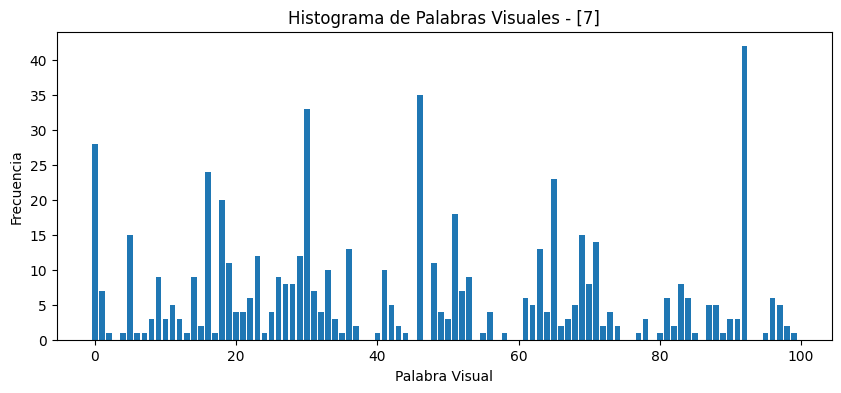

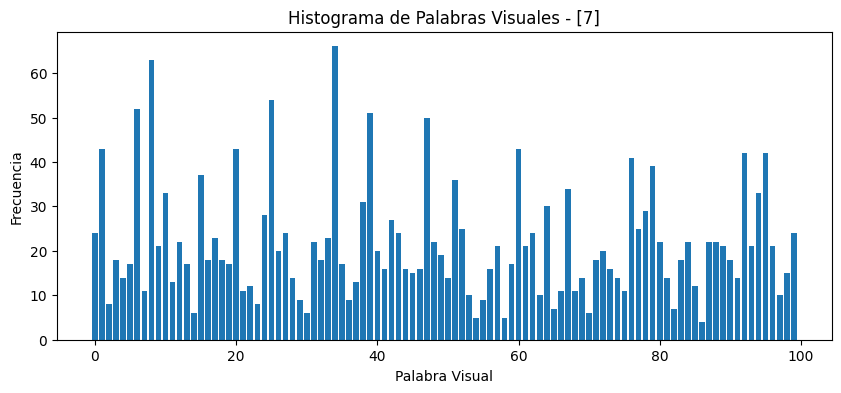

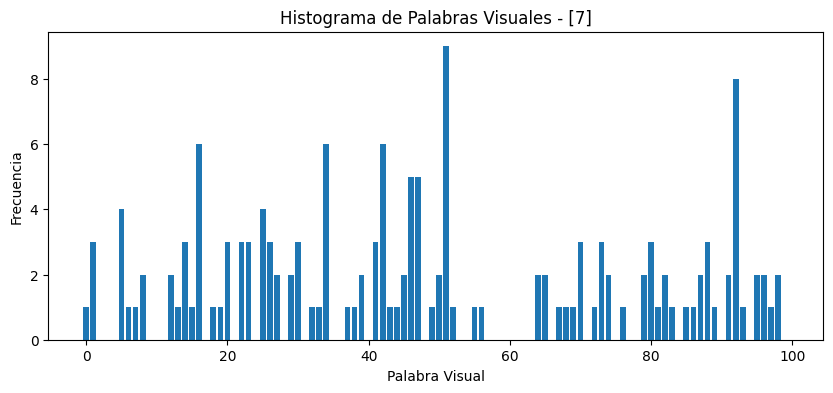

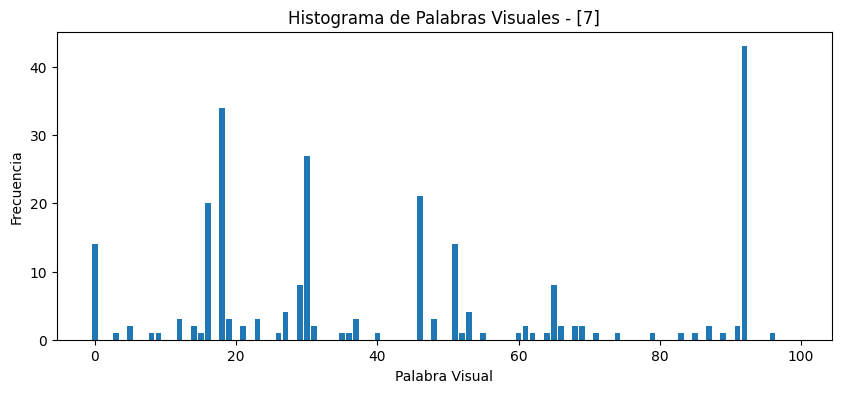

In [111]:
def plot_histogram(hist, label="Clase"):
    plt.figure(figsize=(10, 4))
    plt.bar(np.arange(len(hist)), hist)
    plt.title(f"Histograma de Palabras Visuales - {label}")
    plt.xlabel("Palabra Visual")
    plt.ylabel("Frecuencia")
    plt.show()

for i in range(300):
  plot_histogram(histograms[i], label=labels[i])


Esta función permite visualizar el histograma de palabras visuales de una imagen. Cada barra representa la frecuencia de una palabra visual (clúster) en esa imagen. Al graficar varios histogramas, se puede observar cómo diferentes clases (como alimentos con o sin moho) presentan patrones distintos. Esto es útil tanto para análisis exploratorio como para entender qué tan representativo es el vocabulario construido.


## Machine Learning Pipeline en Scikit-Learn.

### Extracción de características BoVW y preparación del conjunto de datos

Antes de construir el pipeline de clasificación, es necesario transformar nuestras imágenes en representaciones numéricas que puedan ser interpretadas por los modelos de aprendizaje automático. Para ello, utilizamos un enfoque basado en **Bag of Visual Words** (*BoVW*), el cual convierte cada imagen en un vector de características a partir de descriptores locales.

En esta sección se implementan dos funciones auxiliares fundamentales:


**1. `extract_bovw_features(img_path, kmeans_model, num_clusters)`**: Esta función convierte una imagen individual en su representación BoVW. El proceso incluye:
- Lectura de la imagen y conversión a escala de grises.
- Detección de puntos clave y extracción de descriptores con SIFT.
- Cuantización de los descriptores utilizando un modelo `k-means` previamente entrenado, que asigna cada descriptor a un clúster visual.
- Construcción de un histograma de frecuencias que indica la cantidad de veces que aparece cada palabra visual en la imagen.
Este histograma resultante es el vector de características que representa la imagen.

**2. `load_dataset_bovw(dataset_dir, kmeans_model, num_clusters)`**: Esta función permite procesar un conjunto completo de imágenes (como entrenamiento, validación o prueba). Las principales tareas que realiza son:
- Recorrer cada subcarpeta correspondiente a una clase (por ejemplo: `freshapples`, `rottenbananas`, etc.).
- Asignar una etiqueta binaria (`0` para frutas frescas, `1` para frutas podridas) utilizando un diccionario de mapeo.
- Aplicar la función `extract_bovw_features` a cada imagen para obtener su representación BoVW.
- Almacenar las representaciones en un arreglo `X` y sus etiquetas correspondientes en `y`.


Finalmente, estas funciones se utilizan para convertir y cargar los conjuntos de datos (`train`, `val`, `test`), dejando las imágenes listas para su uso en el pipeline de clasificación.


In [ ]:
def extract_bovw_features(img_path, kmeans_model, num_clusters):
    img = cv2.imread(img_path)
    if img is None:
        return None
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = sift.detectAndCompute(gray, None)
    if des is None:
        return np.zeros(num_clusters)
    words = kmeans_model.predict(des)
    hist, _ = np.histogram(words, bins=np.arange(num_clusters + 1))
    return hist

def load_dataset_bovw(dataset_dir, kmeans_model, num_clusters):
    X = []
    y = []
    class_map = {
        'freshapples': 0, 'freshbananas': 0, 'freshoranges': 0,
        'rottenapples': 1, 'rottenbananas': 1, 'rottenoranges': 1
    }

    for label_folder in os.listdir(dataset_dir):
        full_path = os.path.join(dataset_dir, label_folder)
        if not os.path.isdir(full_path):
            continue
        label = class_map.get(label_folder)
        if label is None:
            continue
        for img_file in os.listdir(full_path):
            if img_file.lower().endswith(".png"):
                img_path = os.path.join(full_path, img_file)
                feat = extract_bovw_features(img_path, kmeans_model, num_clusters)
                if feat is not None:
                    X.append(feat)
                    y.append(label)
    return np.array(X), np.array(y)

train_dir = "/content/drive/MyDrive/dataset_simplified/train"
val_dir = "/content/drive/MyDrive/dataset_simplified/val"
test_dir = "/content/drive/MyDrive/dataset_simplified/test"

X_train, y_train = load_dataset_bovw(train_dir, kmeans, num_clusters)
X_val, y_val = load_dataset_bovw(val_dir, kmeans, num_clusters)
X_test, y_test = load_dataset_bovw(test_dir, kmeans, num_clusters)
print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")

📦 Cargando datasets...
✅ Train: (300, 50), Val: (120, 50), Test: (60, 50)


### ¿Por qué dividir los datos en entrenamiento, validación y prueba?
Una división adecuada del conjunto de datos es fundamental para evaluar correctamente el desempeño de un modelo de aprendizaje automático y evitar problemas como el sobreajuste (overfitting). En el caso particular de visión por computador, esta práctica cobra aún mayor relevancia debido a la alta complejidad y dimensionalidad de los datos visuales.

*   **Conjunto de entrenamiento (train)**: Este subconjunto se utiliza para ajustar los parámetros del modelo. Es decir, es donde el algoritmo aprende los patrones a partir de las imágenes y sus respectivas etiquetas. Es crucial que este conjunto tenga una buena representación de la variabilidad presente en el problema para favorecer la capacidad de generalización del modelo.
*   **Conjunto de validación (validation)**:
Se emplea durante el proceso de ajuste de hiperparámetros, tales como C en máquinas de vectores de soporte (SVM) o n_neighbors en KNN. Su objetivo principal es evaluar distintas configuraciones de modelos sin utilizar el conjunto de prueba. Esto permite seleccionar la mejor combinación de modelo e hiperparámetros antes de la evaluación final. Cabe destacar que el modelo no se entrena directamente sobre este conjunto.
*   **Conjunto de prueba (test)**: Este subconjunto se reserva exclusivamente para la evaluación final, una vez que el modelo ha sido entrenado y afinado. Proporciona una estimación objetiva del rendimiento del modelo sobre datos completamente nuevos, simulando así su comportamiento en un entorno real.

### Entrenamiento, Validación y Selección de Modelo

Una vez que las imágenes han sido convertidas a vectores de características utilizando BoVW, podemos construir el pipeline de clasificación. Este pipeline incluye tanto el preprocesamiento de los datos como el ajuste y validación de distintos modelos con búsqueda de hiperparámetros.

#### 1. Preprocesamiento

Se utiliza `StandardScaler` para normalizar las características numéricas, lo que es crucial para modelos sensibles a la escala como SVM y KNN.

Aunque este pipeline solo considera variables numéricas (los histogramas BoVW), se deja preparado para incorporar futuros preprocesamientos categóricos utilizando `ColumnTransformer` y `OneHotEncoder`.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Preprocesamiento solo para variables numéricas
numeric_preprocessor = Pipeline([
    ('scaler', StandardScaler())
])

preprocessor = numeric_preprocessor

#### 2. Modelos y búsqueda de hiperparámetros

Se definen múltiples clasificadores populares junto con los valores de hiperparámetros que se desean explorar para encontrar la mejor configuración mediante validación cruzada.

- **SVM (Support Vector Machine)**  
  Modelo de clasificación que busca el hiperplano que mejor separa las clases en el espacio de características. Es eficaz en espacios de alta dimensión y puede adaptarse con diferentes funciones kernel.  
  *Hiperparámetros evaluados:*  
  `C` (penalización del error), `kernel` (`linear`, `rbf`)

- **Random Forest**  
  Ensamble de árboles de decisión entrenados sobre subconjuntos aleatorios de los datos. Mejora la precisión y reduce el sobreajuste al combinar múltiples árboles.  
  *Hiperparámetros evaluados:*  
  `n_estimators` (número de árboles), `max_depth` (profundidad máxima de los árboles)

- **KNN (K-Nearest Neighbors)**  
  Clasificador basado en la cercanía a los ejemplos de entrenamiento más próximos. No necesita entrenamiento explícito, pero puede ser costoso en predicción.  
  *Hiperparámetros evaluados:*  
  `n_neighbors` (número de vecinos más cercanos)

- **Regresión Logística**  
  Modelo lineal utilizado para clasificación binaria. Calcula la probabilidad de una clase mediante una función logística aplicada a una combinación lineal de las variables.  
  *Hiperparámetros evaluados:*  
  `C` (regularización inversa)

- **Gradient Boosting**  
  Algoritmo de ensamble que construye árboles secuenciales, donde cada nuevo árbol intenta corregir los errores del anterior. Tiende a tener buen rendimiento en muchos problemas de clasificación.  
  *Hiperparámetros evaluados:*  
  `n_estimators` (número de árboles), `learning_rate` (tasa de aprendizaje)


In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

models = {
    "SVM": {
        "model": SVC(),
        "params": {
            "model__C": [0.1, 1, 10],
            "model__kernel": ["linear", "rbf"]
        }
    },
    "RandomForest": {
        "model": RandomForestClassifier(random_state=42),
        "params": {
            "model__n_estimators": [50, 100],
            "model__max_depth": [None, 10, 20]
        }
    },
    "KNN": {
        "model": KNeighborsClassifier(),
        "params": {
            "model__n_neighbors": [3, 5, 7]
        }
    },
    "LogisticRegression": {
        "model": LogisticRegression(max_iter=1000),
        "params": {
            "model__C": [0.1, 1, 10]
        }
    },
    "GradientBoosting": {
        "model": GradientBoostingClassifier(random_state=42),
        "params": {
            "model__n_estimators": [50, 100],
            "model__learning_rate": [0.01, 0.1]
        }
    }
}


#### 3. Entrenamiento y validación de modelos

Se entrena cada uno de los modelos definidos anteriormente utilizando **`GridSearchCV`**, que realiza una búsqueda exhaustiva de combinaciones de hiperparámetros mediante validación cruzada (en este caso, `cv=3`).

Cada modelo es incorporado dentro de un **pipeline** junto con el preprocesamiento (escalado numérico). Esto garantiza que los pasos de transformación se apliquen correctamente dentro del proceso de validación.

Durante el entrenamiento, se evalúa el desempeño de cada modelo en el conjunto de validación (`X_val`, `y_val`) y se almacena el modelo que obtiene el mejor `accuracy`.

Variables clave:
- `best_model`: almacena el modelo con mejor rendimiento en validación.
- `best_score`: precisión más alta obtenida.
- `best_name`: nombre del mejor modelo.
- `results`: diccionario con los resultados de precisión de todos los modelos evaluados.

Este paso es fundamental para seleccionar el modelo más prometedor antes de evaluar el rendimiento final sobre el conjunto de prueba.


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

best_score = 0
best_model = None
best_name = ""
results = {}

print("\nEntrenando y tuneando modelos...\n")

for name, cfg in models.items():
    print(f"Probando {name}...")

    pipe = Pipeline([
        ("preprocessing", preprocessor),
        ("model", cfg["model"])
    ])

    grid = GridSearchCV(pipe, cfg["params"], cv=3, scoring='accuracy')
    grid.fit(X_train, y_train)

    val_preds = grid.predict(X_val)
    val_acc = accuracy_score(y_val, val_preds)
    results[name] = val_acc

    print(f"{name} - Accuracy en validación: {val_acc:.4f}\n")

    if val_acc > best_score:
        best_score = val_acc
        best_model = grid.best_estimator_
        best_name = name



Entrenando y tuneando modelos...

Probando SVM...
SVM - Accuracy en validación: 0.7750

Probando RandomForest...
RandomForest - Accuracy en validación: 0.8000

Probando KNN...
KNN - Accuracy en validación: 0.8333

Probando LogisticRegression...
LogisticRegression - Accuracy en validación: 0.8000

Probando GradientBoosting...
GradientBoosting - Accuracy en validación: 0.7750



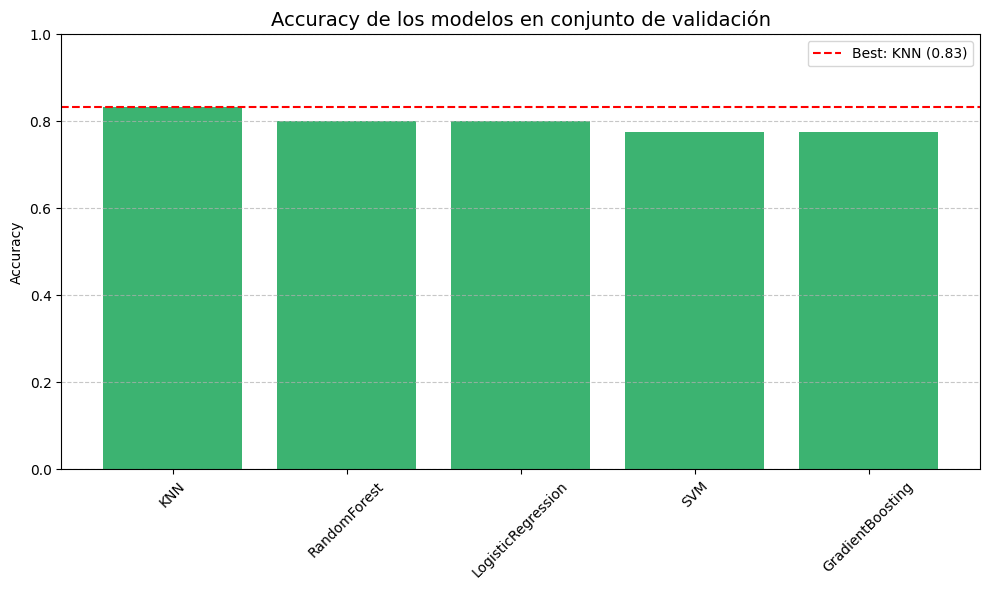

In [ ]:
import matplotlib.pyplot as plt

# Ordenamos los resultados por accuracy descendente
sorted_results = dict(sorted(results.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(10, 6))
plt.bar(sorted_results.keys(), sorted_results.values(), color='mediumseagreen')
plt.axhline(y=best_score, color='red', linestyle='--', label=f"Best: {best_name} ({best_score:.2f})")

plt.title("Accuracy de los modelos en conjunto de validación", fontsize=14)
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


#### 4. Evaluación final en el conjunto de prueba

Una vez seleccionado KNN, el mejor modelo según su rendimiento en validación, evaluamos su desempeño en el conjunto de prueba (`X_test`, `y_test`), el cual no fue utilizado en ninguna etapa previa del entrenamiento o ajuste de hiperparámetros.

Este paso permite obtener una estimación realista y objetiva del rendimiento del modelo en datos completamente nuevos.

Se calcula:
- **`accuracy_score`**: proporción de predicciones correctas sobre el total de muestras del conjunto de prueba.
- **`classification_report`**: incluye métricas como precisión, recall y F1-score para cada clase (`Fresh` y `Rotten`), ofreciendo una visión más detallada del rendimiento por categoría.

Este análisis final es clave para validar que el modelo generaliza bien fuera del entorno de entrenamiento y que puede ser utilizado en escenarios del mundo real.


In [ ]:
from sklearn.metrics import classification_report

print(f"\nMejor modelo: {best_name} con accuracy en validación: {best_score:.4f}")
print("Evaluando en conjunto de test...")

test_preds = best_model.predict(X_test)
test_acc = accuracy_score(y_test, test_preds)

print(f"\nAccuracy en test: {test_acc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, test_preds, target_names=["Fresh", "Rotten"]))



Mejor modelo: KNN con accuracy en validación: 0.8333
Evaluando en conjunto de test...

Accuracy en test: 0.8667

Classification Report:
              precision    recall  f1-score   support

       Fresh       0.81      0.97      0.88        30
      Rotten       0.96      0.77      0.85        30

    accuracy                           0.87        60
   macro avg       0.88      0.87      0.87        60
weighted avg       0.88      0.87      0.87        60



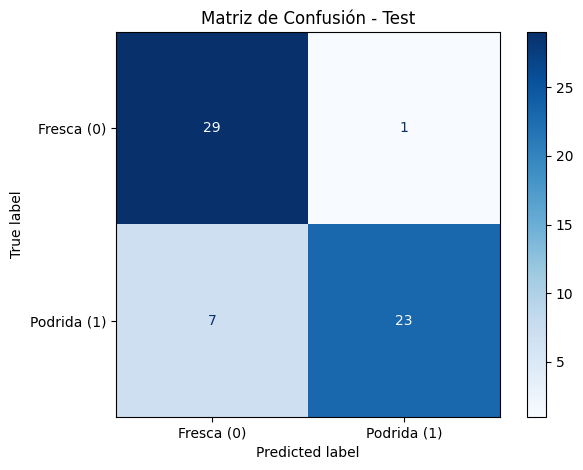

📋 Reporte de Clasificación (Test):

              precision    recall  f1-score   support

      Fresca       0.81      0.97      0.88        30
     Podrida       0.96      0.77      0.85        30

    accuracy                           0.87        60
   macro avg       0.88      0.87      0.87        60
weighted avg       0.88      0.87      0.87        60



In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Predecir con el mejor modelo sobre el set de test
y_pred = best_model.predict(X_test)

# 2. Matriz de Confusión
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Fresca (0)", "Podrida (1)"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión - Test")
plt.tight_layout()
plt.show()

# 3. Métricas de clasificación
print("Reporte de Clasificación (Test):\n")
print(classification_report(y_test, y_pred, target_names=["Fresca", "Podrida"]))


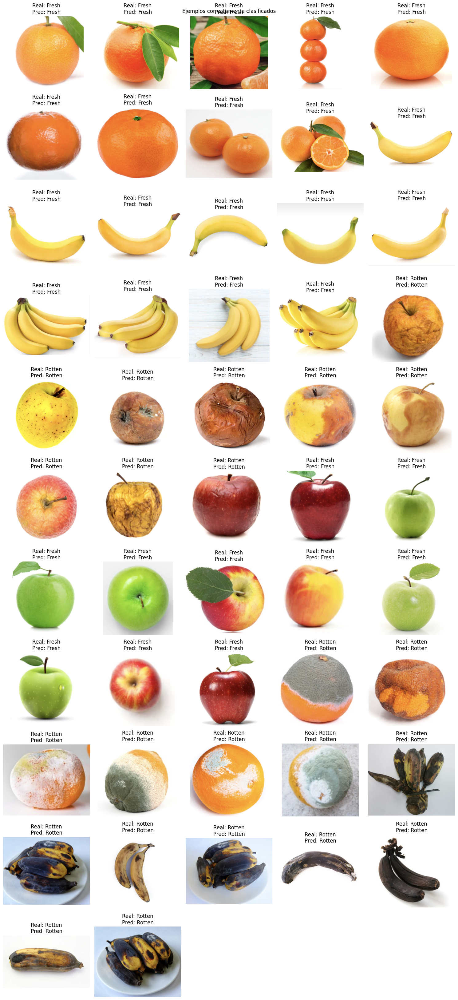

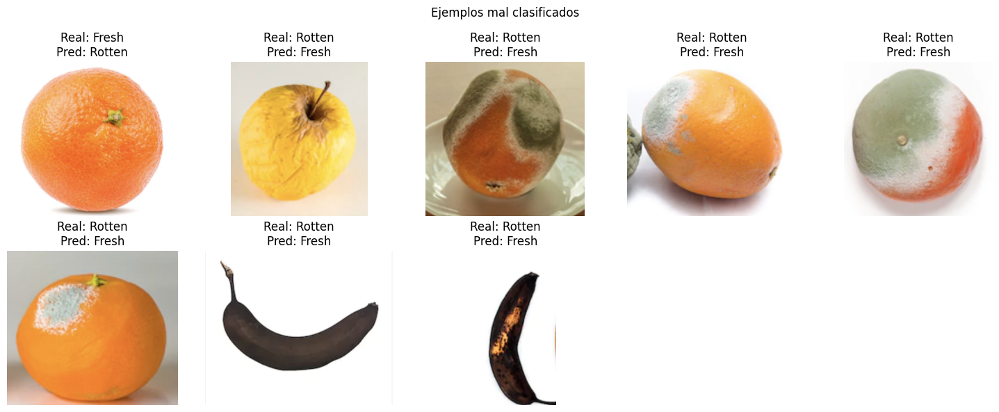

In [110]:
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

def show_images(indices, title):
    num_images_to_show = len(indices)  # Mostrar todas
    cols = 5
    rows = (num_images_to_show + cols - 1) // cols  # Cálculo dinámico de filas
    plt.figure(figsize=(15, rows * 3))

    for i, idx in enumerate(indices):
        image_path = get_image_path_from_index(idx)

        if image_path is None:
            continue  # Saltar si no encuentra la imagen

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"Real: {'Fresh' if y_test[idx] == 0 else 'Rotten'}\nPred: {'Fresh' if y_pred[idx] == 0 else 'Rotten'}")
        plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


def get_image_path_from_index(index):
    """Retrieves the original image path based on the index in X_test."""
    count = 0
    for label_folder in os.listdir(test_dir):
        full_path = os.path.join(test_dir, label_folder)
        if not os.path.isdir(full_path):
            continue
        for img_file in os.listdir(full_path):
            if img_file.lower().endswith(".png"):
                if count == index:
                    return os.path.join(full_path, img_file)
                count += 1
    return None # Return None if index is out of bounds

# Calculate correct and wrong indices before calling show_images
correct_idxs = np.where(y_test == y_pred)[0]
wrong_idxs = np.where(y_test != y_pred)[0]

# Mostrar ejemplos bien clasificados
show_images(correct_idxs, "Ejemplos correctamente clasificados")

# Mostrar ejemplos mal clasificados
show_images(wrong_idxs, "Ejemplos mal clasificados")

5. Análisis de resultados
El modelo evaluado obtuvo un accuracy del 87% en el conjunto de prueba, lo cual representa un rendimiento general sólido. Un análisis detallado por clase permite identificar patrones relevantes en el comportamiento del clasificador:

Clase "Fresca":

Precisión: 0.81 – De todas las frutas clasificadas como frescas, el 81% realmente lo eran.

Recall: 0.97 – El modelo identificó correctamente el 97% de las frutas frescas del conjunto.

F1-score: 0.88 – Buen equilibrio entre precisión y cobertura para esta clase.

Clase "Podrida":

Precisión: 0.96 – El 96% de las frutas clasificadas como podridas estaban correctamente etiquetadas.

Recall: 0.77 – El modelo reconoció correctamente el 77% de las frutas podridas, pero clasificó el 23% como frescas por error.

F1-score: 0.85 – Buen rendimiento, aunque con margen de mejora en la sensibilidad (recall).

Observaciones clave:
El modelo muestra una alta confianza al predecir frutas podridas, como lo indica su precisión del 96%, pero tiende a no detectar algunos casos (7 frutas podridas fueron clasificadas como frescas).

En cambio, la clase "fresca" presenta un recall muy alto, lo que sugiere que el modelo rara vez omite frutas frescas, aunque puede equivocarse ocasionalmente al clasificarlas.

Las métricas agregadas (macro avg y weighted avg) muestran un rendimiento equilibrado entre ambas clases, lo cual es positivo considerando que el conjunto de prueba está balanceado.

Conclusión:
El modelo demuestra un buen desempeño general, con especial efectividad al reconocer frutas frescas. Sin embargo, sería recomendable aumentar el recall de la clase "podrida", especialmente en contextos donde detectar productos en mal estado sea crítico. Para esto, se podrían explorar ajustes en el umbral de decisión, técnicas de balanceo de clases (SMOTE, class_weight='balanced'), o incluso un refinamiento del conjunto de datos.